In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,ExtraTreesClassifier
from sklearn.metrics import roc_curve,RocCurveDisplay
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import confusion_matrix


In [2]:
df=pd.read_csv('C:/Users/Admin\OneDrive/Desktop/EDUCATION/DATA SET_DATATRAINED/WA_Fn-UseC_-HR-Employee-Attrition.csv')
df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
df.count()

Age                         1470
Attrition                   1470
BusinessTravel              1470
DailyRate                   1470
Department                  1470
DistanceFromHome            1470
Education                   1470
EducationField              1470
EmployeeCount               1470
EmployeeNumber              1470
EnvironmentSatisfaction     1470
Gender                      1470
HourlyRate                  1470
JobInvolvement              1470
JobLevel                    1470
JobRole                     1470
JobSatisfaction             1470
MaritalStatus               1470
MonthlyIncome               1470
MonthlyRate                 1470
NumCompaniesWorked          1470
Over18                      1470
OverTime                    1470
PercentSalaryHike           1470
PerformanceRating           1470
RelationshipSatisfaction    1470
StandardHours               1470
StockOptionLevel            1470
TotalWorkingYears           1470
TrainingTimesLastYear       1470
WorkLifeBa

In [4]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [5]:
for column in df:
    un=df[column].unique().size
    print(column,un)

Age 43
Attrition 2
BusinessTravel 3
DailyRate 886
Department 3
DistanceFromHome 29
Education 5
EducationField 6
EmployeeCount 1
EmployeeNumber 1470
EnvironmentSatisfaction 4
Gender 2
HourlyRate 71
JobInvolvement 4
JobLevel 5
JobRole 9
JobSatisfaction 4
MaritalStatus 3
MonthlyIncome 1349
MonthlyRate 1427
NumCompaniesWorked 10
Over18 1
OverTime 2
PercentSalaryHike 15
PerformanceRating 2
RelationshipSatisfaction 4
StandardHours 1
StockOptionLevel 4
TotalWorkingYears 40
TrainingTimesLastYear 7
WorkLifeBalance 4
YearsAtCompany 37
YearsInCurrentRole 19
YearsSinceLastPromotion 16
YearsWithCurrManager 18


In [6]:
## The columns has only one value, considered as no effect in list. so we have dropped the column. 
## the Employee number is a column with unique value, so we can drop it
df_n= df.drop(columns=['Over18','StandardHours','EmployeeNumber','EmployeeCount'])

In [7]:
## we have created a imaginary column as sustainability and take the average of each satisfaction level to make interpretation easy.
df_n['Sustainablity']=(df_n['EnvironmentSatisfaction']+ df_n['JobSatisfaction']+ df_n['PerformanceRating']+df_n['RelationshipSatisfaction'])/4

In [8]:
## converting float value into intiger to fit the classification model and sampling technique.
df_n['Sustainablity']=df_n['Sustainablity'].astype(int)

In [9]:
df_n.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
Sustainablity               0
dtype: int64

In [10]:
df_n.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany               int64
YearsInCurrentRole  

In [11]:
df_n.describe()


,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Sustainablity
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129,2.452381
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136,0.553574
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,2.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


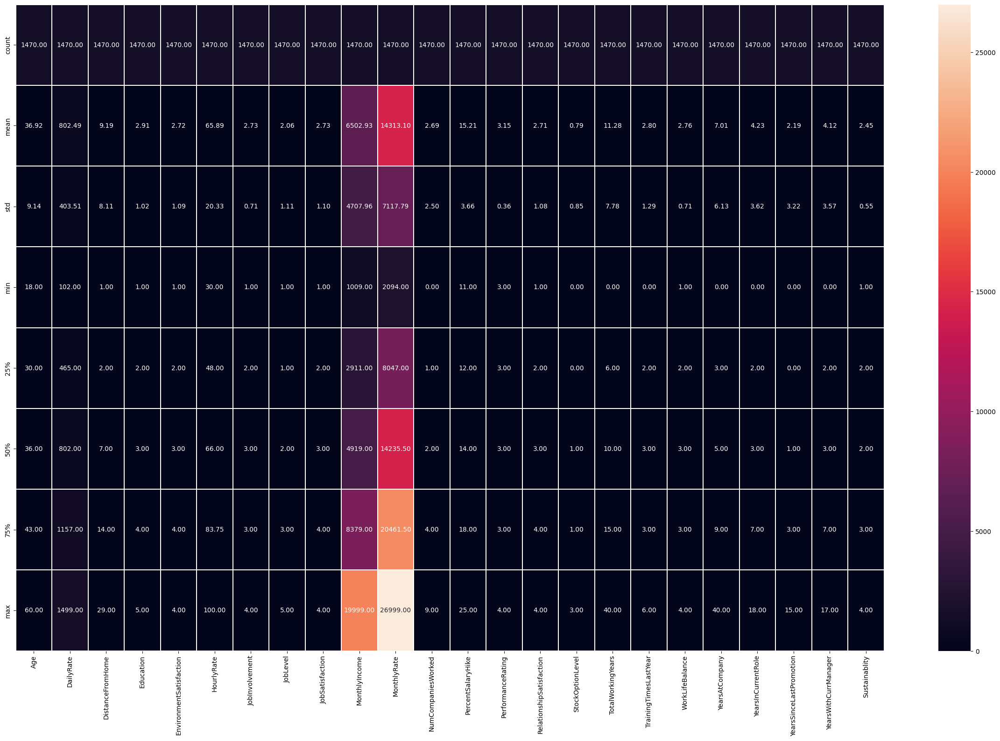

In [12]:
plt.figure(figsize=(30,18))
sns.heatmap(df_n.describe(),linewidths=0.2,linecolor='white',annot=True,fmt='0.2f')
plt.show()

In [13]:
df_n.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Sustainablity'],
      dtype='object')

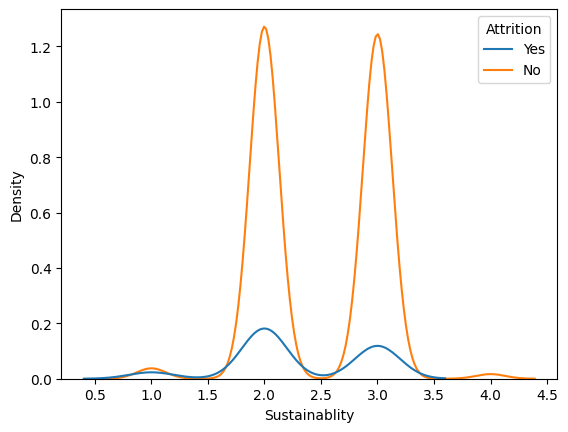

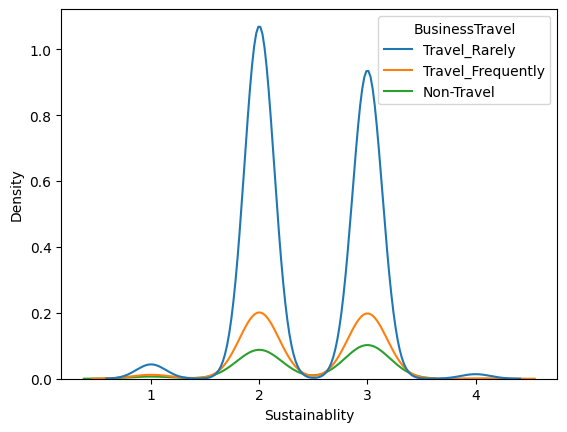

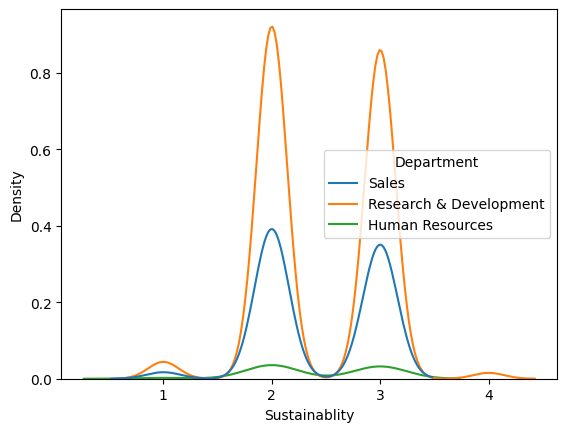

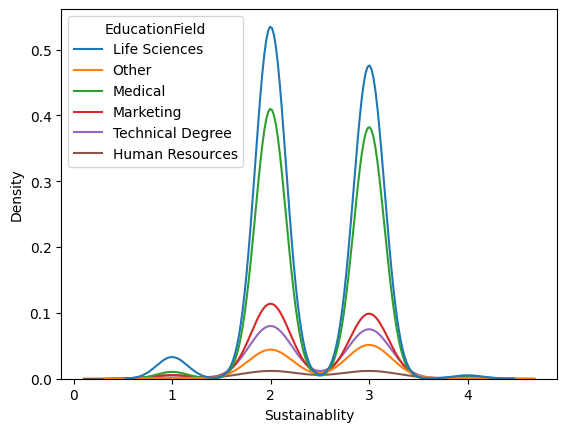

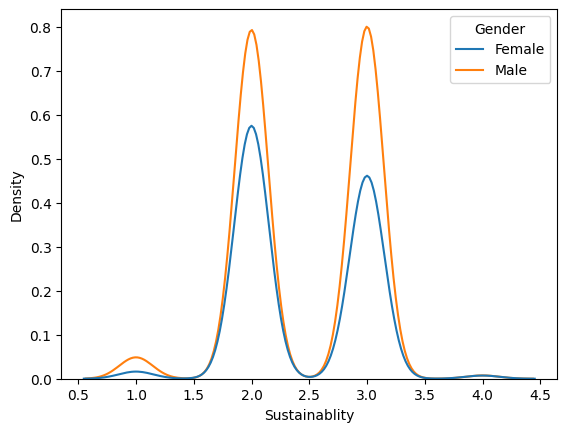

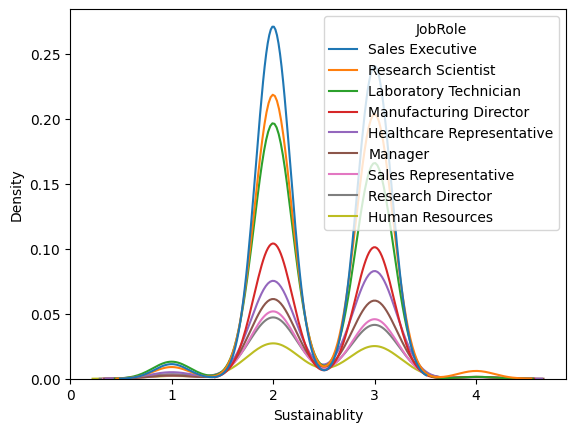

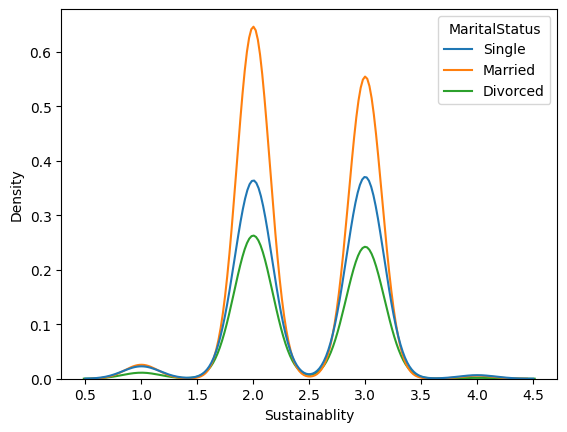

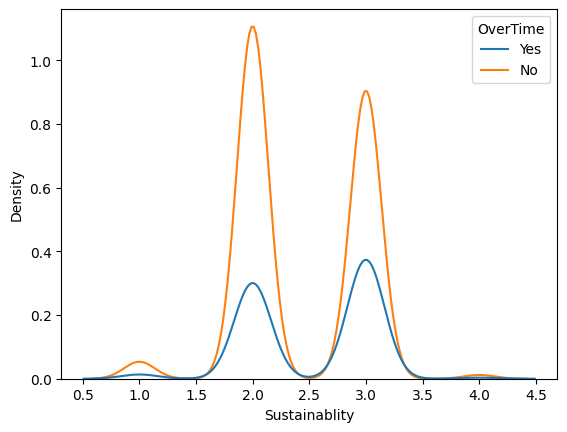

In [14]:
for i in df_n:
    if df_n[i].dtype==object:
        sns.kdeplot(data=df_n,x='Sustainablity',hue=i)
        plt.show()
    else:pass    

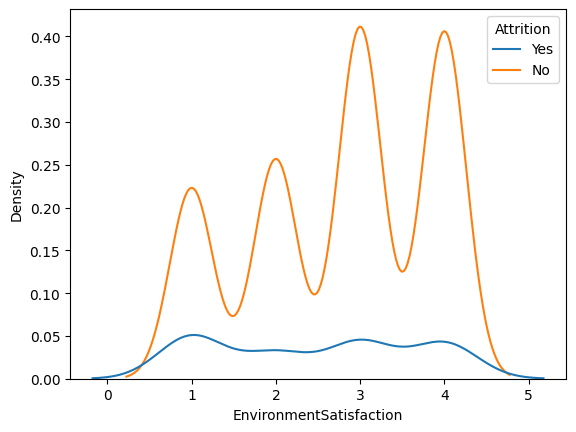

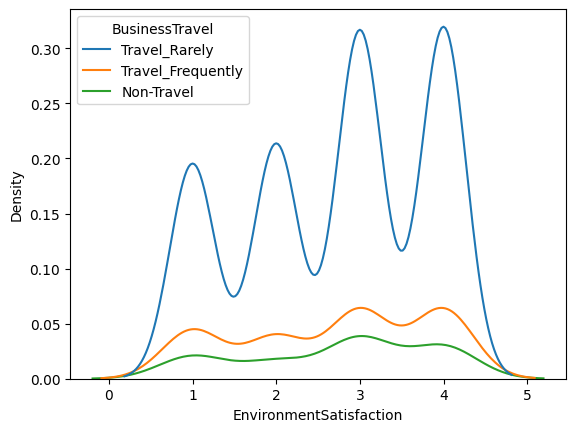

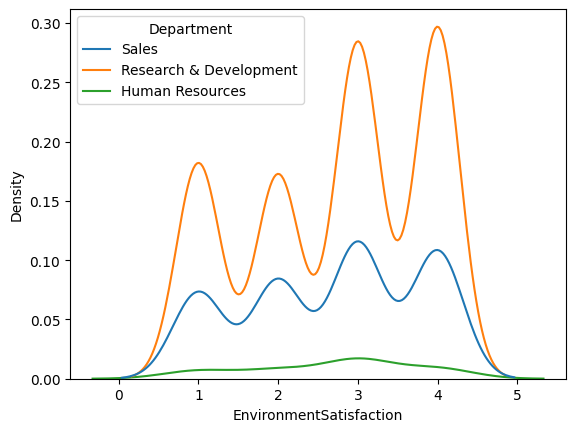

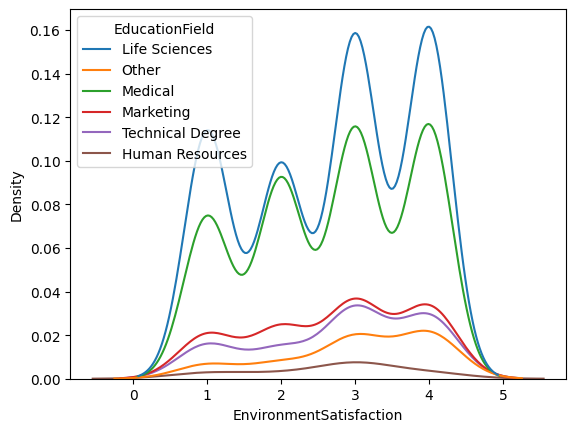

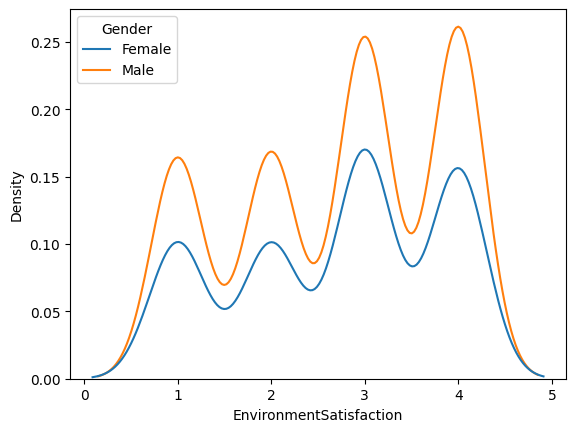

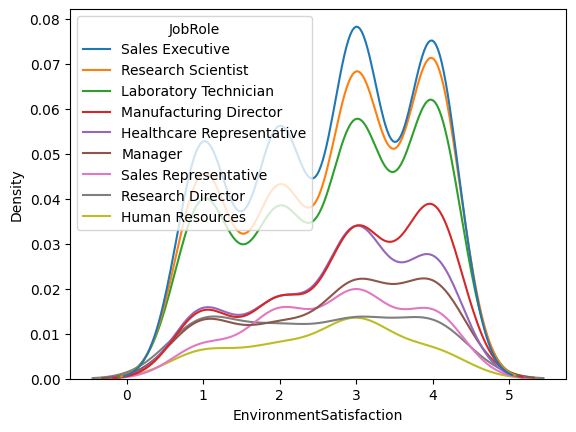

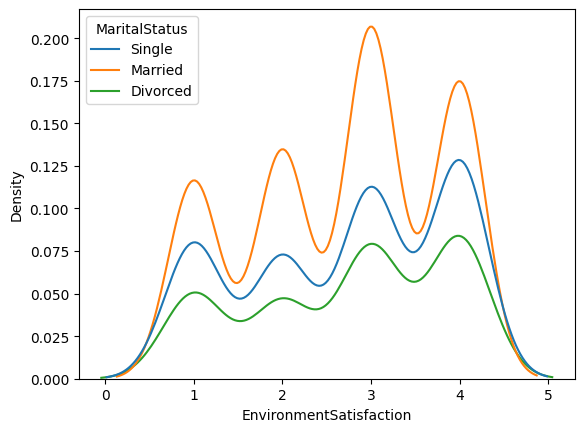

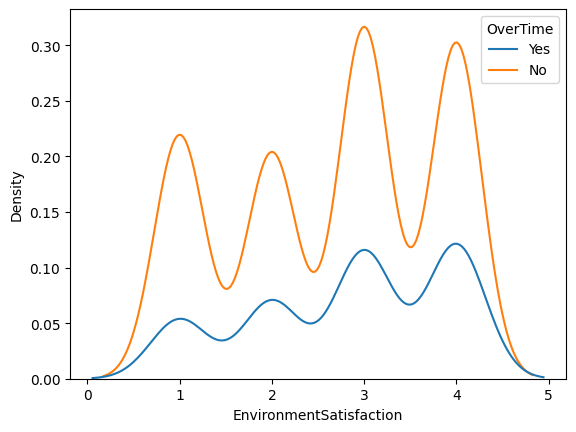

In [15]:
for i in df_n:
    if df_n[i].dtype==object:
        sns.kdeplot(data=df_n,x='EnvironmentSatisfaction',hue=i)
        plt.show()
    else:pass    
    

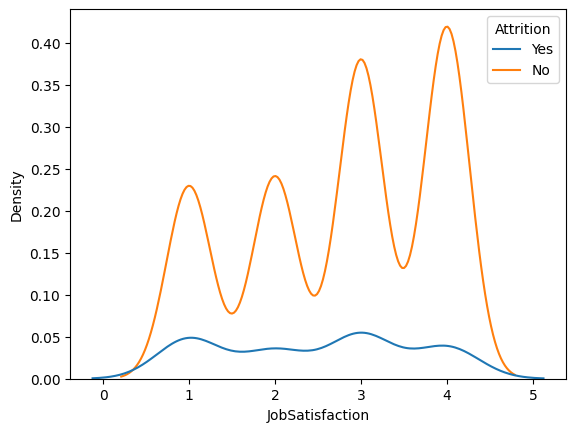

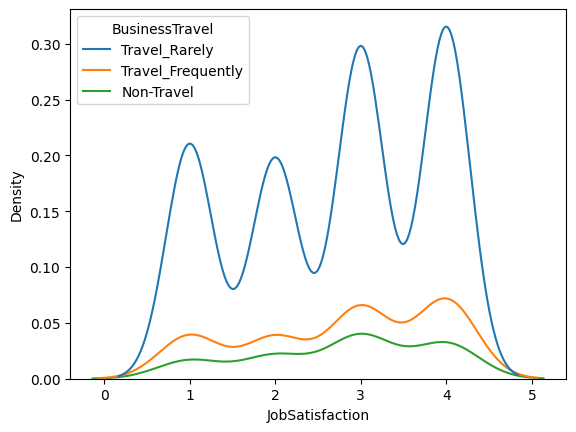

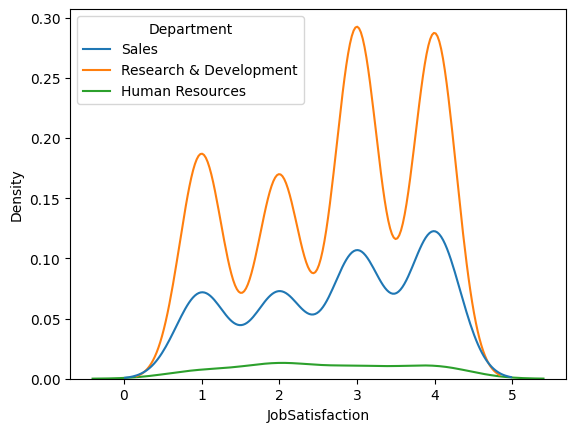

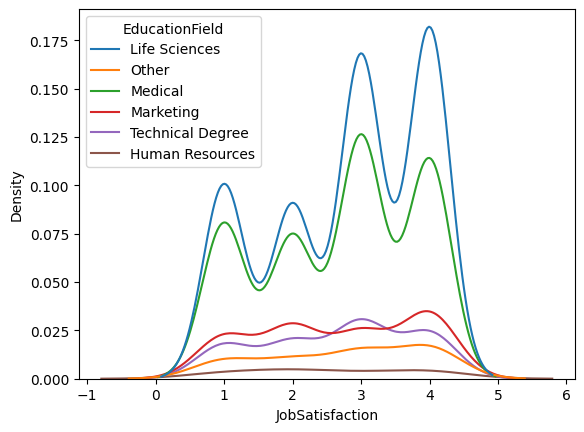

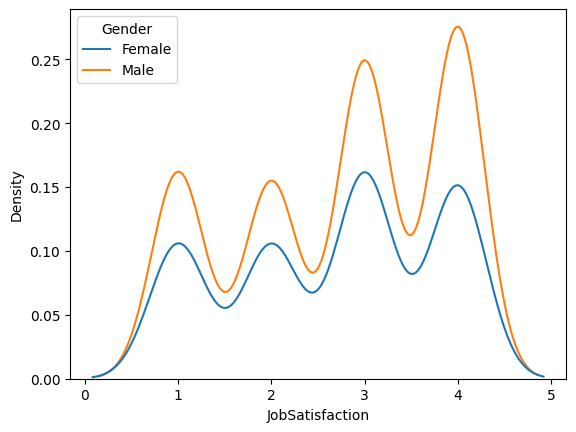

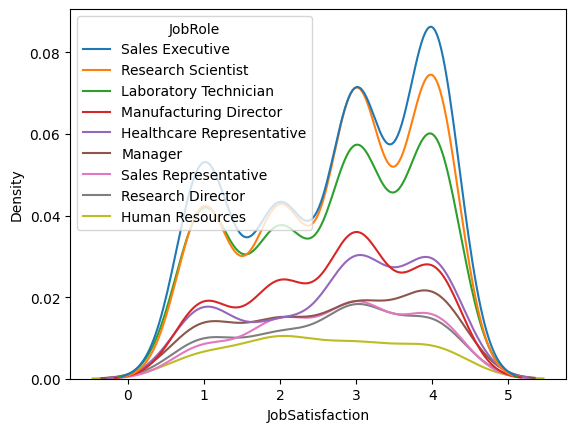

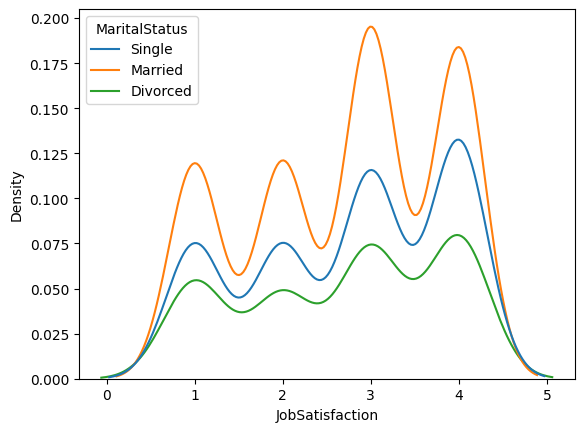

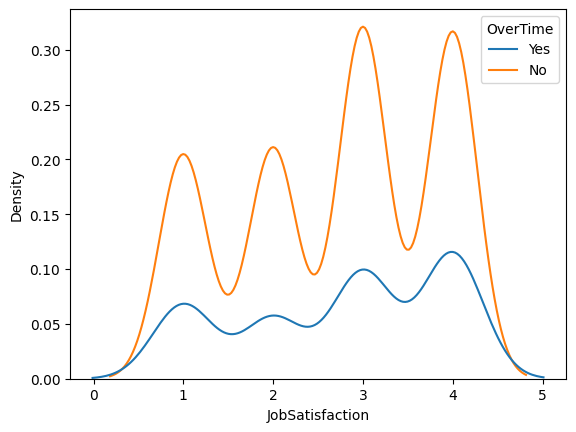

In [16]:
for i in df_n:
    if df_n[i].dtype==object:
        sns.kdeplot(data=df_n,x='JobSatisfaction',hue=i)
        plt.show()
    else:pass  

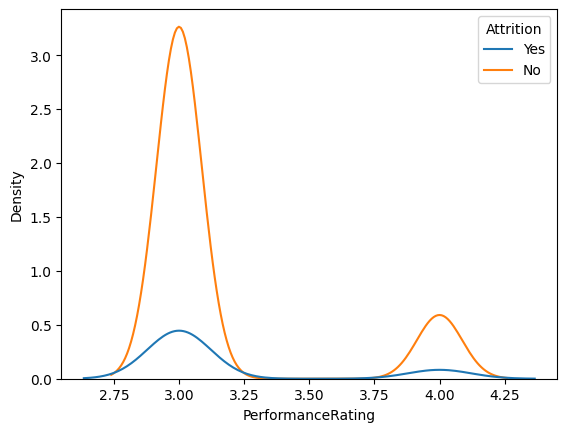

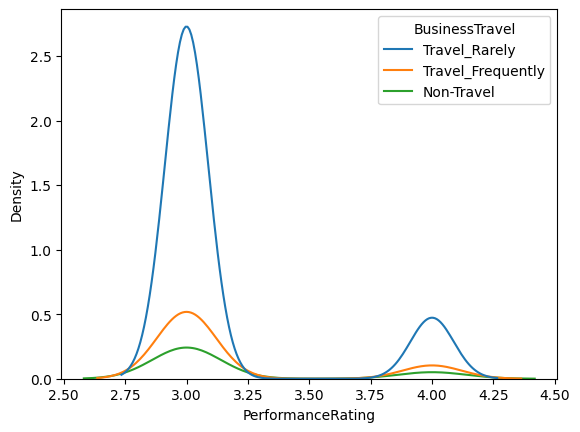

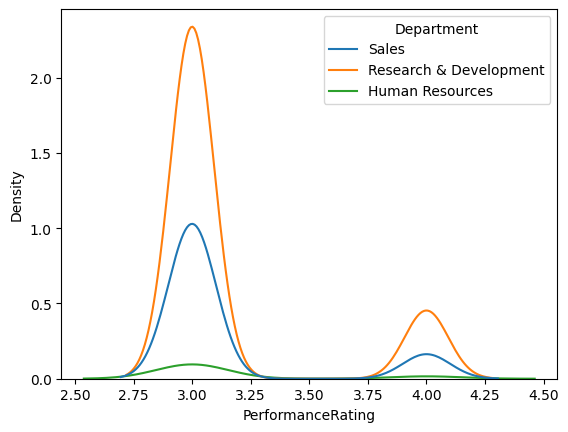

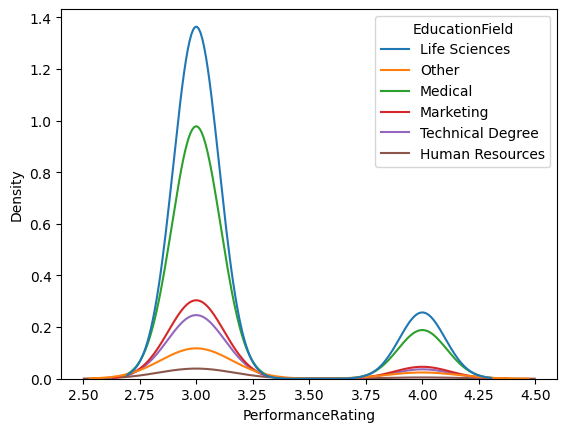

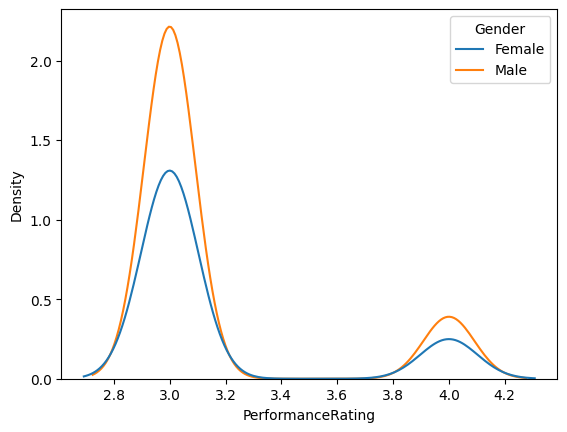

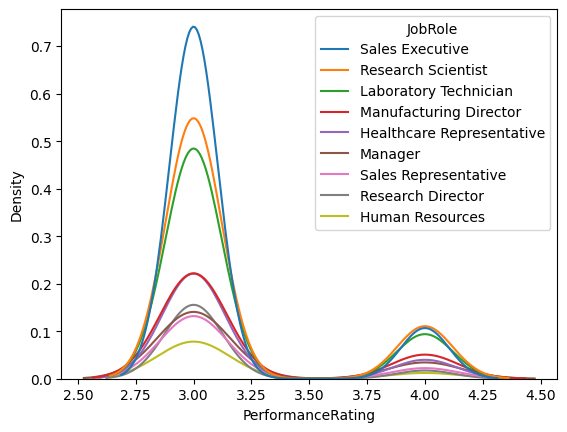

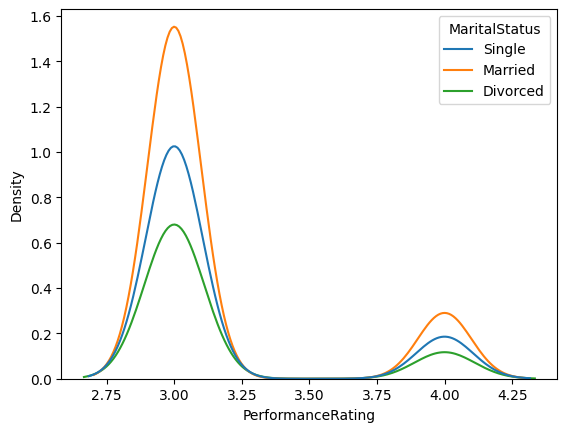

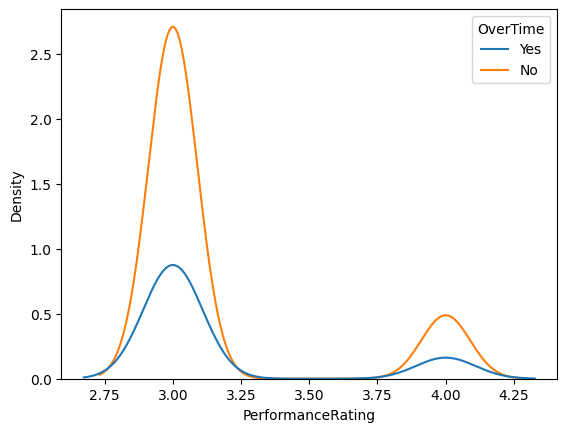

In [17]:
for i in df_n:
    if df_n[i].dtype==object:
        sns.kdeplot(data=df_n,x='PerformanceRating',hue=i)
        plt.show()
    else:pass  

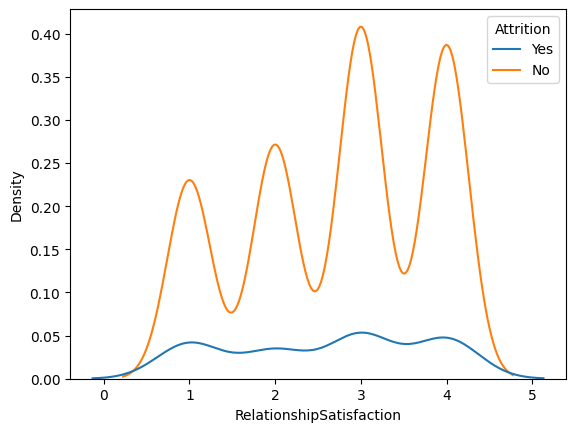

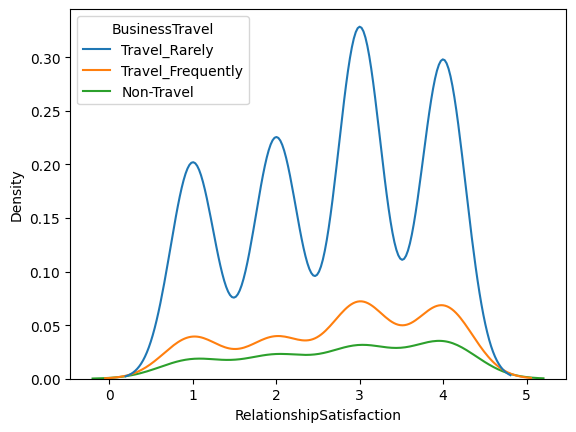

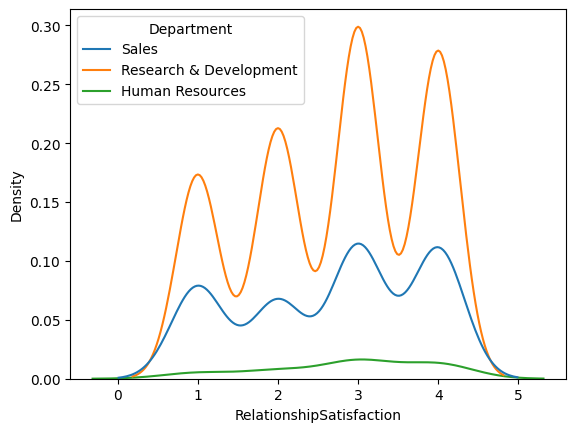

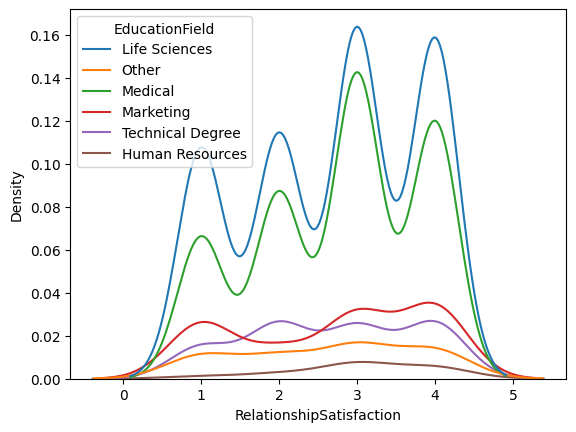

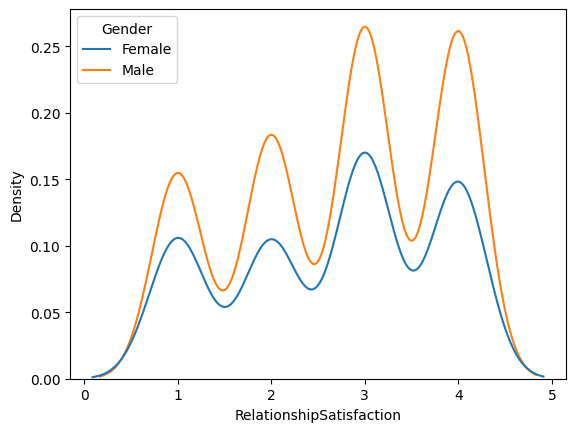

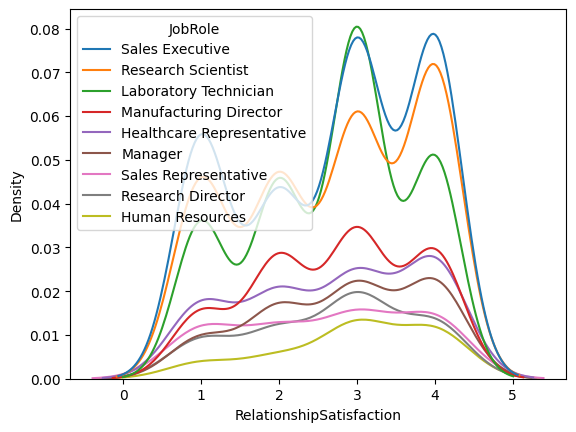

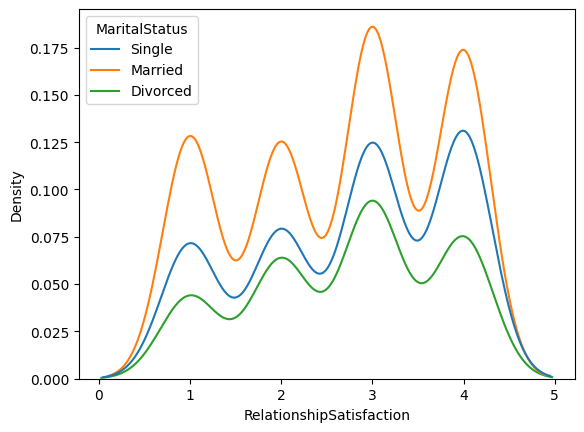

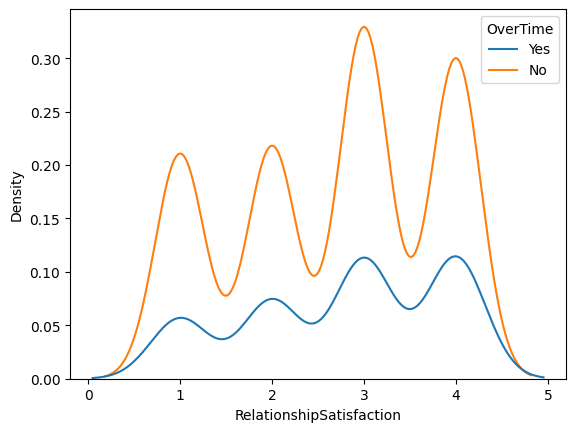

In [18]:
for i in df_n:
    if df_n[i].dtype==object:
        sns.kdeplot(data=df_n,x='RelationshipSatisfaction',hue=i)
        plt.show()
    else:pass  

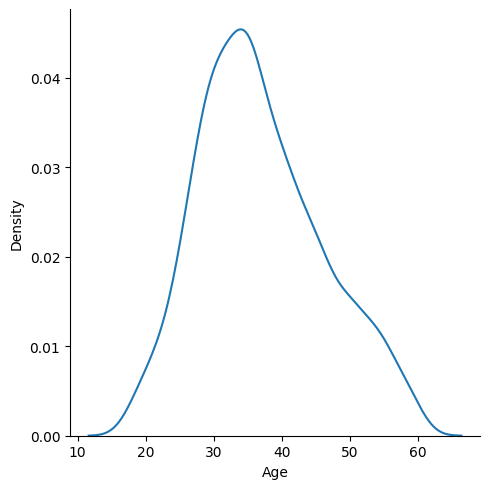

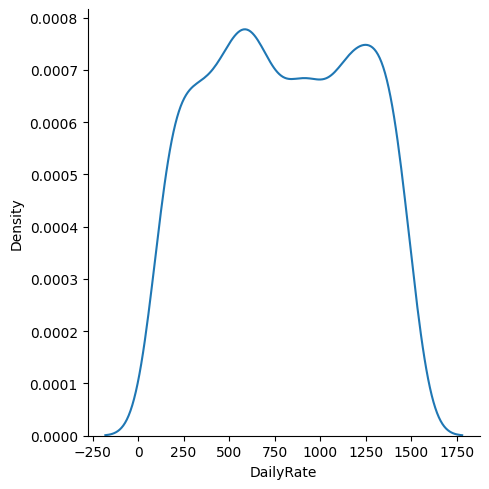

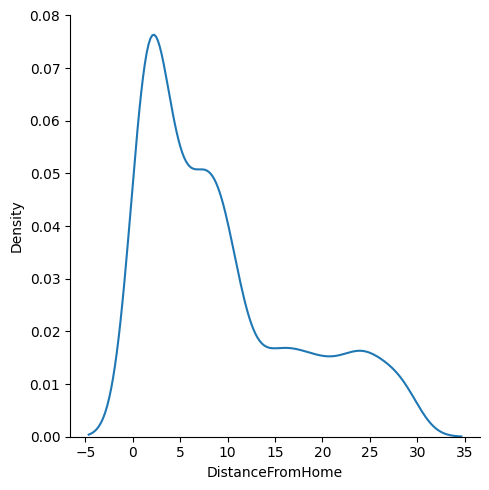

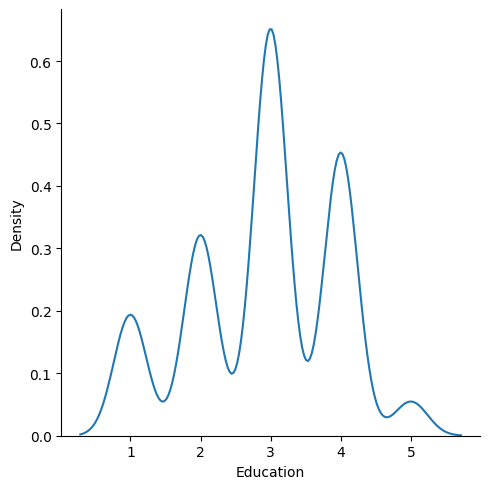

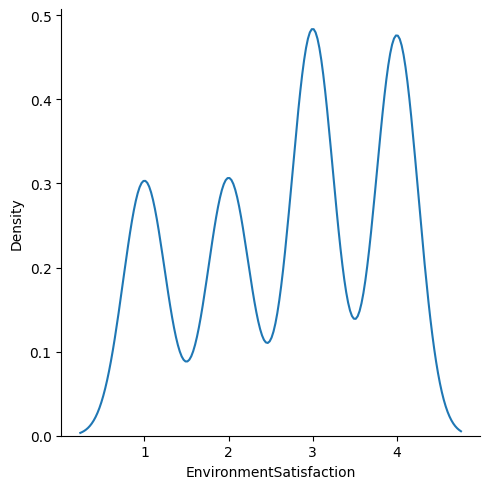

...

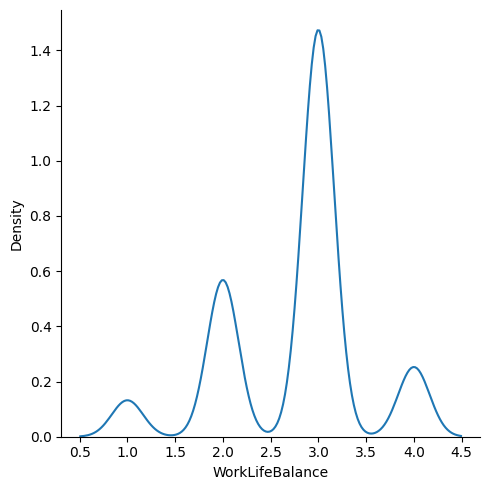

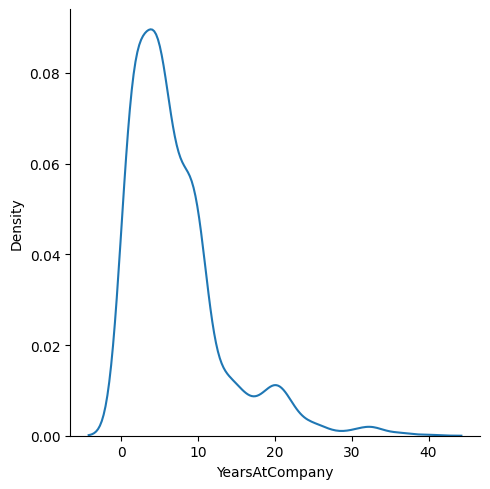

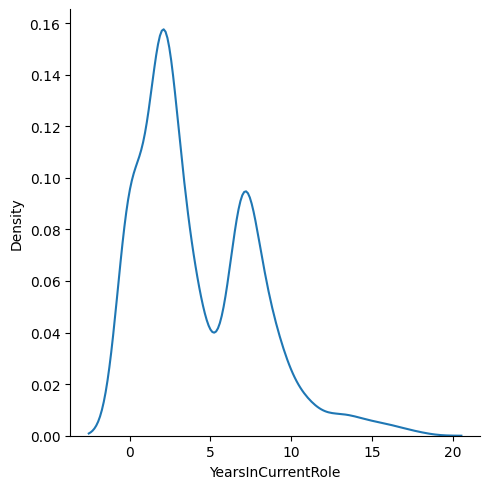

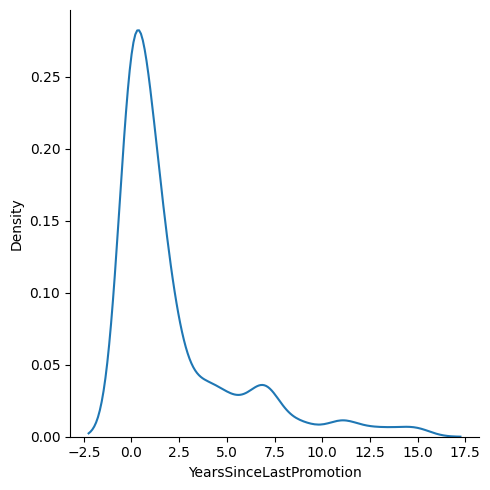

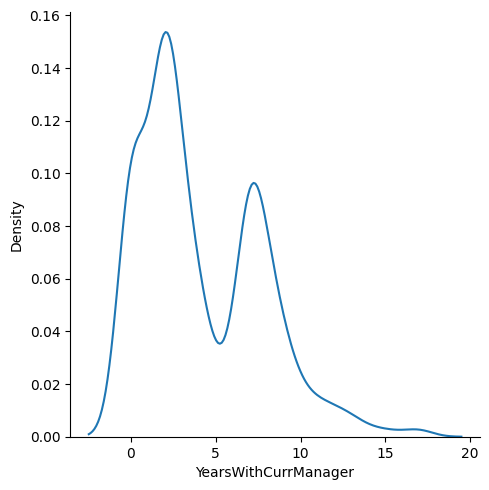

In [19]:
for i in df_n:
    if df_n[i].dtype=='int64'or df_n[i].dtype=='float':
        sns.displot(data=df_n,x=i,kind='kde')
        plt.show()
    else:pass  

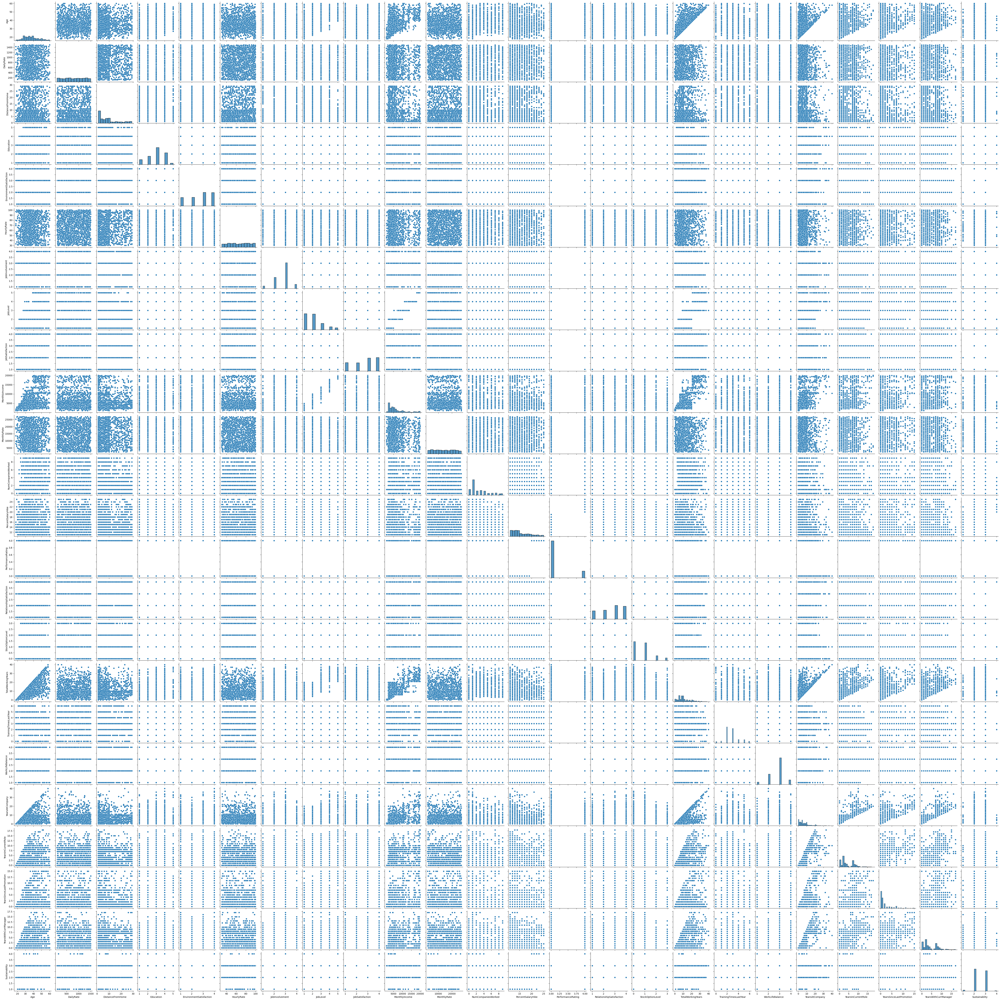

In [20]:
sns.pairplot(data=df_n)

In [21]:
oe=OrdinalEncoder()
for column in df_n:
    if df_n[column].dtype==object:
        oe=OrdinalEncoder()
        df_n[column]=oe.fit_transform(df_n[column].values.reshape(-1,1))
    else:pass    

In [22]:
## Analysis the skew ness and modification
for i in df_n:
    x=df_n[i].skew()
    if x>=5:
        df_n[i]=np.cbrt(df_n[i])
    else:pass
 
print('modified skewness of "df_n_data" is:')
print('=======================================')
print(df_n.skew())

modified skewness of "df_n_data" is:
Age                         0.413286
Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
OverTime                    0.964489
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
W

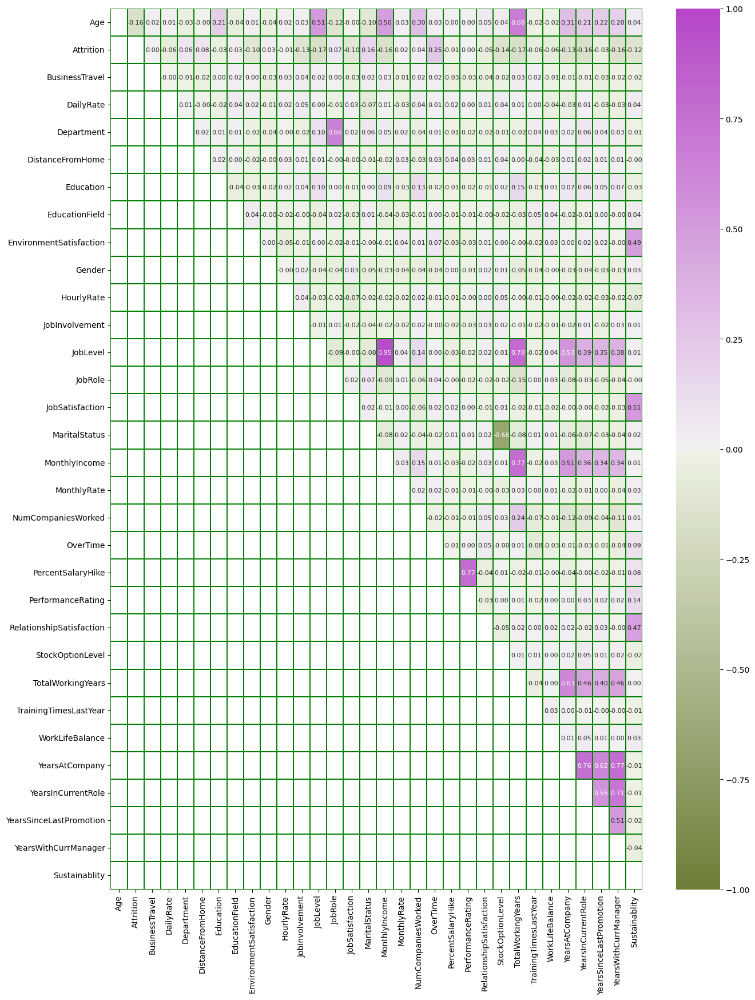

In [23]:
v=df_n.corr()
plt.figure(figsize=(15,20))
mask=np.zeros_like(v)
mask[np.tril_indices_from(mask)]=True
sns.heatmap(v,vmax=1,vmin=-1,annot=True,annot_kws={'fontsize':8},fmt='0.2f',linewidths=0.2,linecolor='green',mask=mask,cmap=sns.diverging_palette(100,300,as_cmap=True))
plt.show()

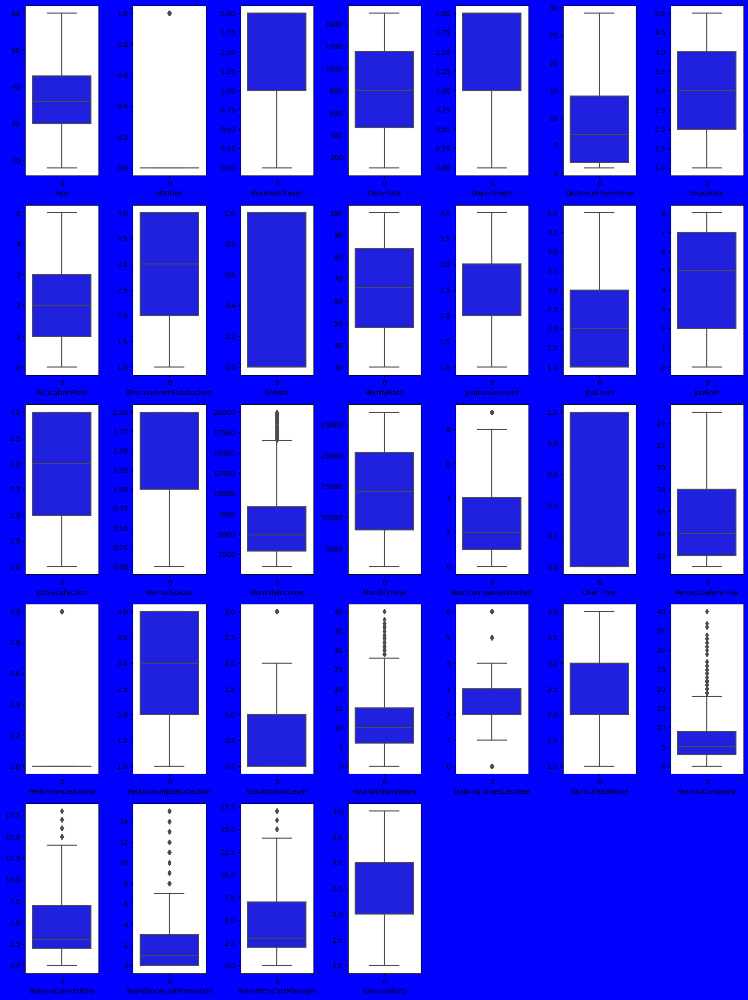

In [24]:
plt.figure(figsize=(15,20),facecolor='blue')
plotnumber=1
for column in df_n:
    plt.subplot(5,7,plotnumber)
    sns.boxplot(df_n[column],color='blue')
    plt.xlabel(column)
    plotnumber+=1
plt.tight_layout()  

In [25]:
columns=df_n.columns
out_lier=df_n[columns]
z=np.abs(zscore(out_lier))
## Removing outlier
df_z=df_n[(z<3).all(axis=1)]
print('## dataloss:')
print((df_n.shape[0]-df_z.shape[0])/(df_n.shape[0])*100)

## dataloss:
5.646258503401361


In [26]:
x=df_z.drop(columns='Sustainablity')
y=df_z['Sustainablity']

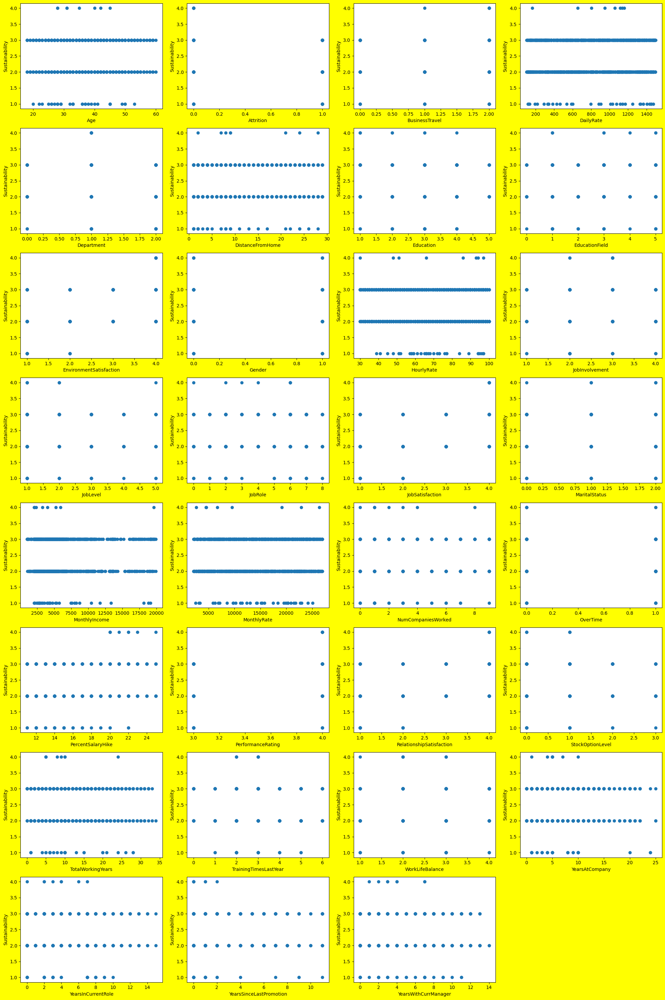

In [27]:
plt.figure(figsize=(20,30), facecolor= 'yellow')
plotnumber=1
for column in x:
    if plotnumber <=32:
        plt.subplot(8,4,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column)
        plt.ylabel('Sustainability')
        plotnumber+=1
plt.tight_layout() 

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [29]:
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(x,i)for i in range(x.shape[1])]
vif['feature']=x.columns
vif

,vif,feature
0,30.994586,Age
1,1.520532,Attrition
2,6.669133,BusinessTravel
3,5.041636,DailyRate
4,13.932479,Department
5,2.342119,DistanceFromHome
6,9.343006,Education
7,3.892970,EducationField
8,7.283358,EnvironmentSatisfaction
9,2.547848,Gender


In [30]:
x=x.drop(columns='PerformanceRating')

In [31]:
sc=StandardScaler()
x_scaled=sc.fit_transform(x)

In [33]:
from imblearn.over_sampling import SMOTE
print('sample distribution before SMOTE:',y.value_counts())


sample distribution before SMOTE: 2    696
3    649
1     34
4      8
Name: Sustainablity, dtype: int64


In [34]:
sm=SMOTE()
x1,y1=sm.fit_resample(x,y)
print('**************************************************')
print('sample distribution after SMOTE:',y1.value_counts())

**************************************************
sample distribution after SMOTE: 2    696
3    696
4    696
1    696
Name: Sustainablity, dtype: int64


In [35]:
max_accuracy=0
max_rs=0
for i in range (1000):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    ETC=ExtraTreesClassifier()
    ETC.fit(x_train,y_train)
    pred=ETC.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc > max_accuracy:
        max_accuracy=acc
        max_rs=i

print('Maximum accuracy:',max_accuracy, 'on random state:',max_rs)

Maximum accuracy: 0.9880382775119617 on random state: 556


In [36]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=max_rs)

In [51]:
DTC=DecisionTreeClassifier()
DTC.fit(x_train,y_train)
P_DTC=DTC.predict(x_test)
P_DTC_T=DTC.predict(x_train)
score_DTC=cross_val_score(DTC,x_test,y_test)
acc_dtc=accuracy_score(y_test,P_DTC)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_DTC))
print('cross_val_score=',score_DTC)
print('--------------------------------------------------------------------------------------')
cv_mean_dtc=score_DTC.mean()
print('--------------------------------------------------------------------------------------')
diff_dtc_score=accuracy_score(y_test,P_DTC)-score_DTC.mean()
print('difference between accuracy and cv_score is::',diff_dtc_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

           1       0.97      1.00      0.99       209
           2       0.96      0.93      0.95       205
           3       0.96      0.96      0.96       217
           4       1.00      1.00      1.00       205

    accuracy                           0.97       836
   macro avg       0.97      0.97      0.97       836
weighted avg       0.97      0.97      0.97       836

cross_val_score= [0.95238095 0.89820359 0.91017964 0.92814371 0.94011976]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.04787867873276008


In [52]:
ETC=ExtraTreesClassifier()
ETC.fit(x_train,y_train)
P_ETC=ETC.predict(x_test)
P_ETC_T=ETC.predict(x_train)
score_ETC=cross_val_score(ETC,x_test,y_test)
acc_ETC=accuracy_score(y_test,P_ETC)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_ETC))
print('cross_val_score=',score_ETC)
print('--------------------------------------------------------------------------------------')
cv_mean_etc=score_ETC.mean()
print('--------------------------------------------------------------------------------------')
diff_etc_score=accuracy_score(y_test,P_ETC)-score_ETC.mean()
print('difference between accuracy and cv_score is::',diff_etc_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       209
           2       0.94      0.97      0.95       205
           3       0.97      0.94      0.96       217
           4       1.00      1.00      1.00       205

    accuracy                           0.98       836
   macro avg       0.98      0.98      0.98       836
weighted avg       0.98      0.98      0.98       836

cross_val_score= [0.95833333 0.95808383 0.96407186 0.97005988 0.97005988]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.013150970785701266


In [56]:
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
P_GB=GB.predict(x_test)
P_GB_T=GB.predict(x_train)
score_GB=cross_val_score(GB,x_test,y_test)
acc_GB=accuracy_score(y_test,P_GB)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_GB))
print('cross_val_score=',score_GB)
print('--------------------------------------------------------------------------------------')
cv_mean_GB=score_GB.mean()
print('--------------------------------------------------------------------------------------')
diff_GB_score=accuracy_score(y_test,P_GB)-score_GB.mean()
print('difference between accuracy and cv_score is::',diff_GB_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       209
           2       0.97      0.99      0.98       205
           3       0.99      0.97      0.98       217
           4       1.00      1.00      1.00       205

    accuracy                           0.99       836
   macro avg       0.99      0.99      0.99       836
weighted avg       0.99      0.99      0.99       836

cross_val_score= [0.94047619 0.98203593 0.94610778 0.95808383 0.9760479 ]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.02868412184516822


In [53]:
KN=KNeighborsClassifier()
KN.fit(x_train,y_train)
P_KN=KN.predict(x_test)
P_KN_T=KN.predict(x_train)
score_KN=cross_val_score(KN,x_test,y_test)
acc_KN=accuracy_score(y_test,P_KN)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_KN))
print('cross_val_score=',score_KN)
print('--------------------------------------------------------------------------------------')
cv_mean_KN=score_KN.mean()
print('--------------------------------------------------------------------------------------')
diff_KN_score=accuracy_score(y_test,P_KN)-score_KN.mean()
print('difference between accuracy and cv_score is::',diff_KN_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

           1       0.57      0.77      0.65       209
           2       0.47      0.40      0.43       205
           3       0.44      0.28      0.34       217
           4       0.65      0.78      0.71       205

    accuracy                           0.55       836
   macro avg       0.53      0.55      0.53       836
weighted avg       0.53      0.55      0.53       836

cross_val_score= [0.45238095 0.47305389 0.46107784 0.52694611 0.45508982]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.07772568328824236


In [54]:
RF=RandomForestClassifier()
RF.fit(x_train,y_train)
P_RF=RF.predict(x_test)
P_RF_T=RF.predict(x_train)
score_RF=cross_val_score(RF,x_test,y_test)
acc_RF=accuracy_score(y_test,P_RF)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_RF))
print('cross_val_score=',score_RF)
print('--------------------------------------------------------------------------------------')
cv_mean_RF=score_RF.mean()
print('--------------------------------------------------------------------------------------')
diff_RF_score=accuracy_score(y_test,P_RF)-score_RF.mean()
print('difference between accuracy and cv_score is::',diff_RF_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       209
           2       0.97      0.97      0.97       205
           3       0.97      0.97      0.97       217
           4       1.00      1.00      1.00       205

    accuracy                           0.98       836
   macro avg       0.98      0.98      0.98       836
weighted avg       0.98      0.98      0.98       836

cross_val_score= [0.96428571 0.94011976 0.94011976 0.96407186 0.94610778]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.032312613324274264


In [55]:
SV=SVC()
SV.fit(x_train,y_train)
P_SV=SV.predict(x_test)
P_SV_T=SV.predict(x_train)
score_SV=cross_val_score(SV,x_test,y_test)
acc_SV=accuracy_score(y_test,P_SV)
print('classification_report------')
print('*********************************************************************************************************************')
print(classification_report(y_test,P_SV))
print('cross_val_score=',score_SV)
print('--------------------------------------------------------------------------------------')
cv_mean_SV=score_SV.mean()
print('--------------------------------------------------------------------------------------')
diff_SV_score=accuracy_score(y_test,P_SV)-score_SV.mean()
print('difference between accuracy and cv_score is::',diff_SV_score)

classification_report------
*********************************************************************************************************************
              precision    recall  f1-score   support

           1       0.29      0.51      0.37       209
           2       0.34      0.05      0.09       205
           3       0.37      0.15      0.21       217
           4       0.36      0.62      0.46       205

    accuracy                           0.33       836
   macro avg       0.34      0.33      0.28       836
weighted avg       0.34      0.33      0.28       836

cross_val_score= [0.28571429 0.35928144 0.33532934 0.33532934 0.28143713]
--------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------
difference between accuracy and cv_score is:: 0.011921406674006707


In [57]:
ml_compare=pd.DataFrame()
DT_C={'regressior_name':DTC,'CV_MEAN':cv_mean_dtc,'accuracy_score':acc_dtc,'acc-cv_diff':diff_dtc_score}
ET_C={'regressior_name':'Extra_tree_C','CV_MEAN':cv_mean_etc,'accuracy_score':acc_ETC,'acc-cv_diff':diff_etc_score}
RF_C={'regressior_name':'RandomForestClassifier','CV_MEAN':cv_mean_RF,'accuracy_score':acc_RF,'acc-cv_diff':diff_RF_score}
GB_C={'regressior_name':'gradient boost','CV_MEAN':cv_mean_GB,'accuracy_score':acc_GB,'acc-cv_diff':diff_GB_score}
KNN_C={'regressior_name':KN,'CV_MEAN':cv_mean_KN,'accuracy_score':acc_KN,'acc-cv_diff':diff_KN_score}
SV_C={'regressior_name':SV,'CV_MEAN':cv_mean_SV,'accuracy_score':acc_SV,'acc-cv_diff':diff_SV_score}
ml_compare=ml_compare.append([DT_C,ET_C,RF_C,GB_C,KNN_C,SV_C],ignore_index=True)
ml_compare=ml_compare.set_index(['regressior_name'])

In [58]:
ml_compare

,CV_MEAN,accuracy_score,acc-cv_diff
regressior_name,,,
DecisionTreeClassifier(),0.925806,0.973684,0.047879
Extra_tree_C,0.964122,0.977273,0.013151
RandomForestClassifier,0.950941,0.983254,0.032313
gradient boost,0.960550,0.989234,0.028684
KNeighborsClassifier(),0.473710,0.551435,0.077726
SVC(),0.319418,0.331340,0.011921


<AxesSubplot:ylabel='regressior_name'>

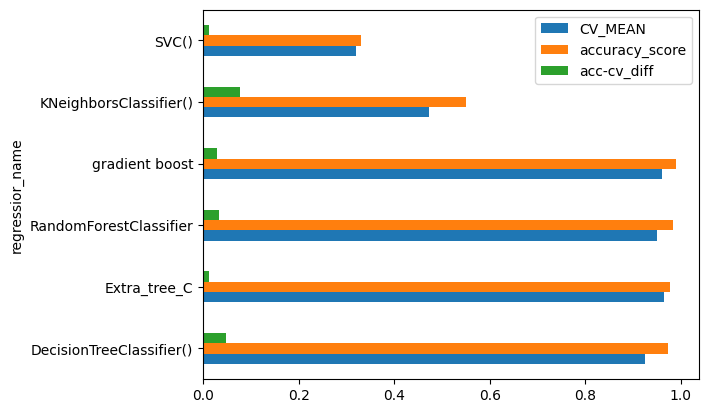

In [59]:
ml_compare.plot.barh()

In [61]:
from sklearn.model_selection import GridSearchCV
p={'n_estimators':100,'criterion':['entropy','gini','log_loss'],'random_state':[100,200,300]}
GCV=GridSearchCV(GradientBoostingClassifier(),param_grid=p1,cv=5)
final=GCV.fit(x_train,y_train)
print(final.best_params_)


{'ccp_alpha': 0, 'criterion': 'friedman_mse', 'learning_rate': 0.1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 200}


In [48]:
final_model=GradientBoostingClassifier(
criterion= 'friedman_mse', 
random_state=100,n_estimators=100,ccp_alpha=0,learning_rate=0.1,min_samples_split=2)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

98.92344497607655


In [49]:
from sklearn import metrics
from sklearn import datasets
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve

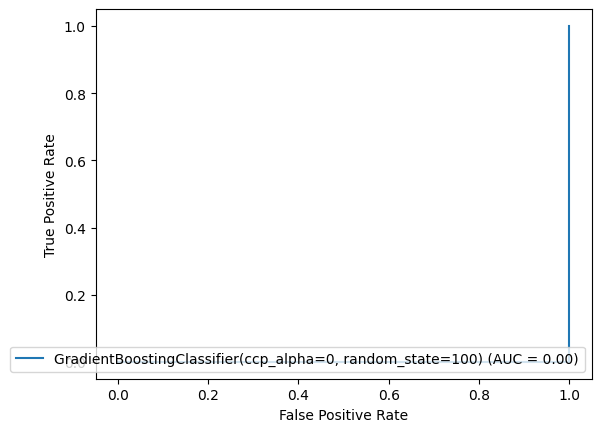

In [50]:
fpr,tpr,thresolds=metrics.roc_curve(y_test,pred,pos_label=1)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=final_model)
display.plot()